In [1]:
from SlitSpectra3 import SlitSpectra as SS
import warnings
import matplotlib.pyplot as plt
from astropy.table import Table
import numpy as np
warnings.filterwarnings('ignore')
%pylab
%matplotlib inline

//anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


Using matplotlib backend: MacOSX
Populating the interactive namespace from numpy and matplotlib


In [4]:
dTImages_r = ['dT4.1_02hh_NS.0052r',
            'dT4.1_04et_NS.0047r',
            'dT4.1_08S_NS.0051r',
            'dT4.1_17A_NS.0050r',
            'dT4.1_39C_NS.0053r',
            'dT4.1_48B_NS.0046r',
            'dT4.1_68D_NS.0045r',
            'dT4.1_69P_NS.0049r',
            'dT4.1_80K_NS.0048r']

dFTImages_r = ['dFT4.1_02hh_NS.0052r',
            'dFT4.1_04et_NS.0047r',
            'dFT4.1_08S_NS.0051r',
            'dFT4.1_17A_NS.0050r',
            'dFT4.1_39C_NS.0053r',
            'dFT4.1_48B_NS.0046r',
            'dFT4.1_68D_NS.0045r',
            'dFT4.1_69P_NS.0049r',
            'dFT4.1_80K_NS.0048r']

dTImages_b = ['dT4.1_02hh_NS.0052b',
            'dT4.1_04et_NS.0047b',
            'dT4.1_08S_NS.0051b',
            'dT4.1_17A_NS.0050b',
            'dT4.1_39C_NS.0053b',
            'dT4.1_48B_NS.0046b',
            'dT4.1_68D_NS.0045b',
            'dT4.1_69P_NS.0049b',
            'dT4.1_80K_NS.0048b']

dFTImages_b = ['dFT4.1_02hh_NS.0052b',
            'dFT4.1_04et_NS.0047b',
            'dFT4.1_08S_NS.0051b',
            'dFT4.1_17A_NS.0050b',
            'dFT4.1_39C_NS.0053b',
            'dFT4.1_48B_NS.0046b',
            'dFT4.1_68D_NS.0045b',
            'dFT4.1_69P_NS.0049b',
            'dFT4.1_80K_NS.0048b']

def trace_center_r_or_b(channel, trace_center_r, trace_center_b):
    if channel == 'b':
        trace_center = trace_center_b
    if channel == 'r':
        trace_center = trace_center_r
    return trace_center

## STEPS TO COMPLETE EXTRACTION ON IMAGES:

###### Step 1 - Determine Apertures + Setup Basic Database:

###### In pyraf:

- Create image + _coords.txt file with upper ap, lower ap, followed by 4 background coords, for each aperture in order from 1+.

- Run apall, add any aperture and save to database, creating a mock base file inside database. (ap+image)

###### In python:
- Define image parameters

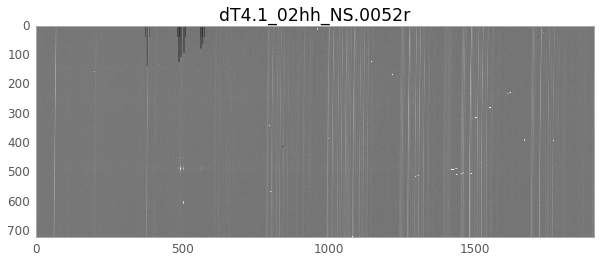

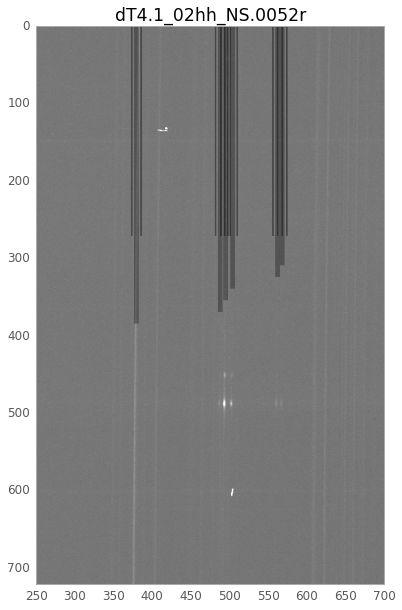

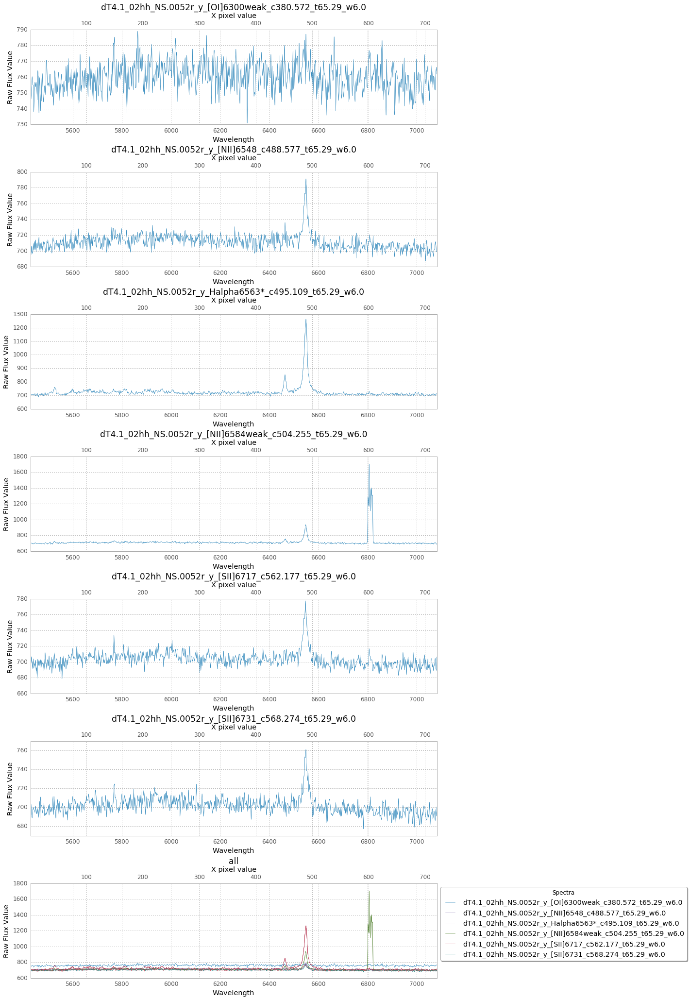

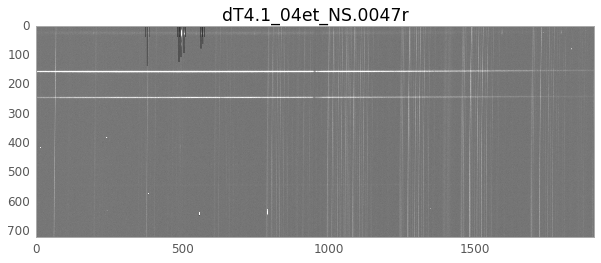

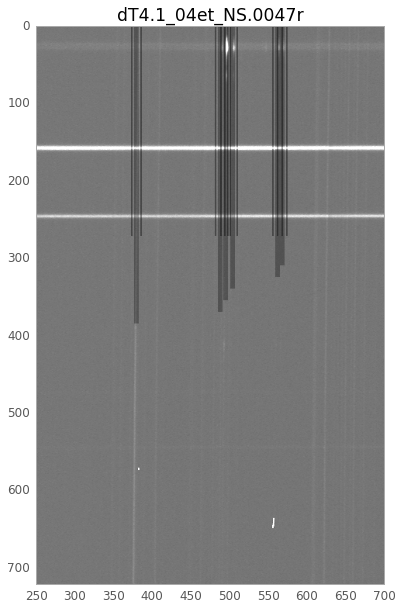

...

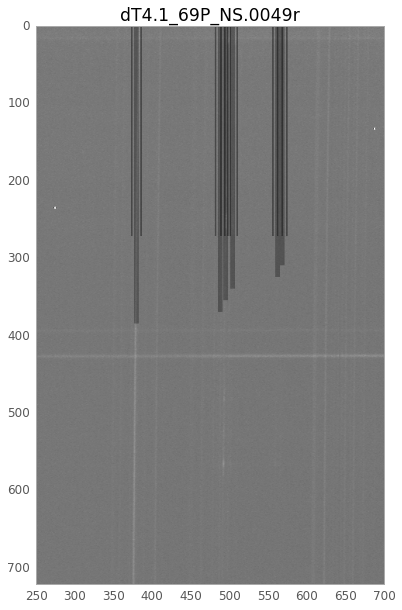

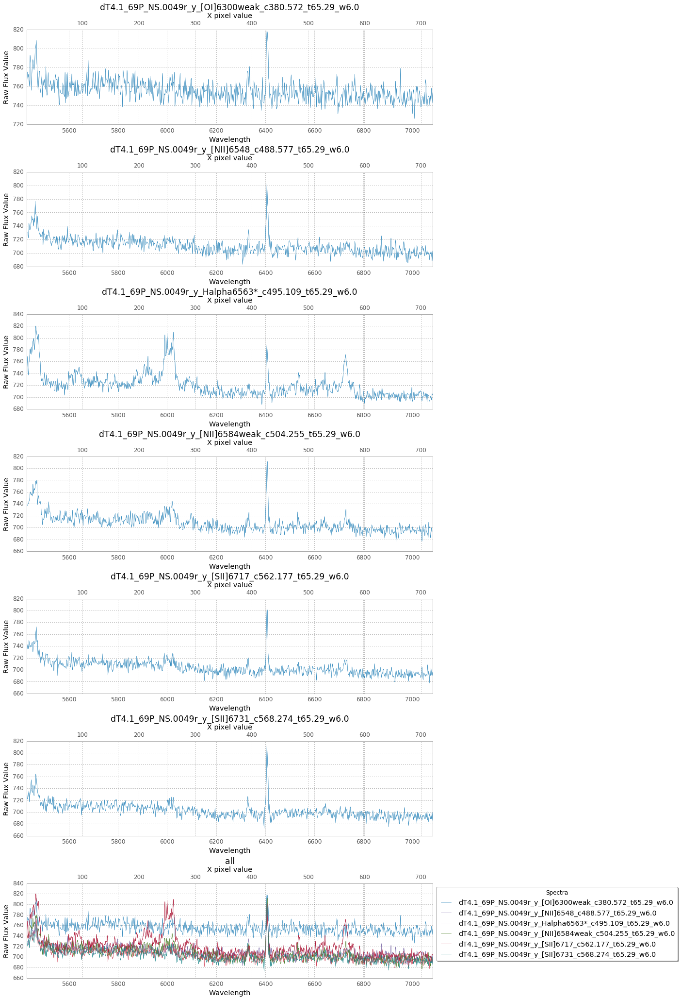

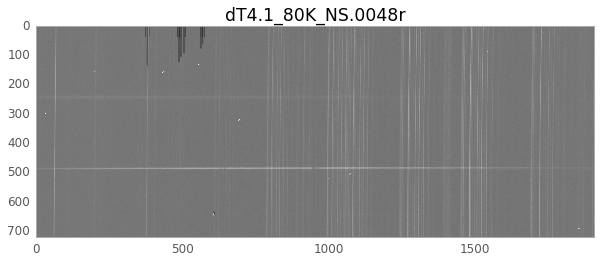

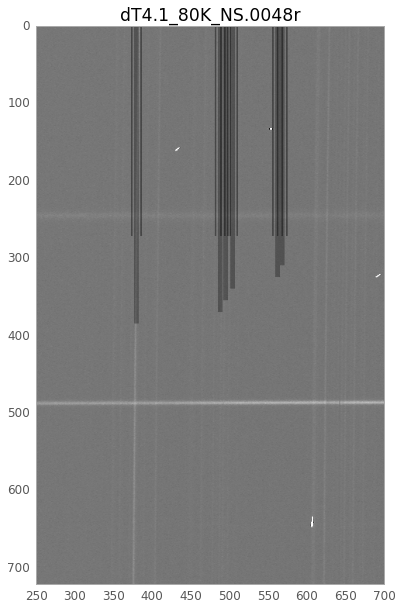

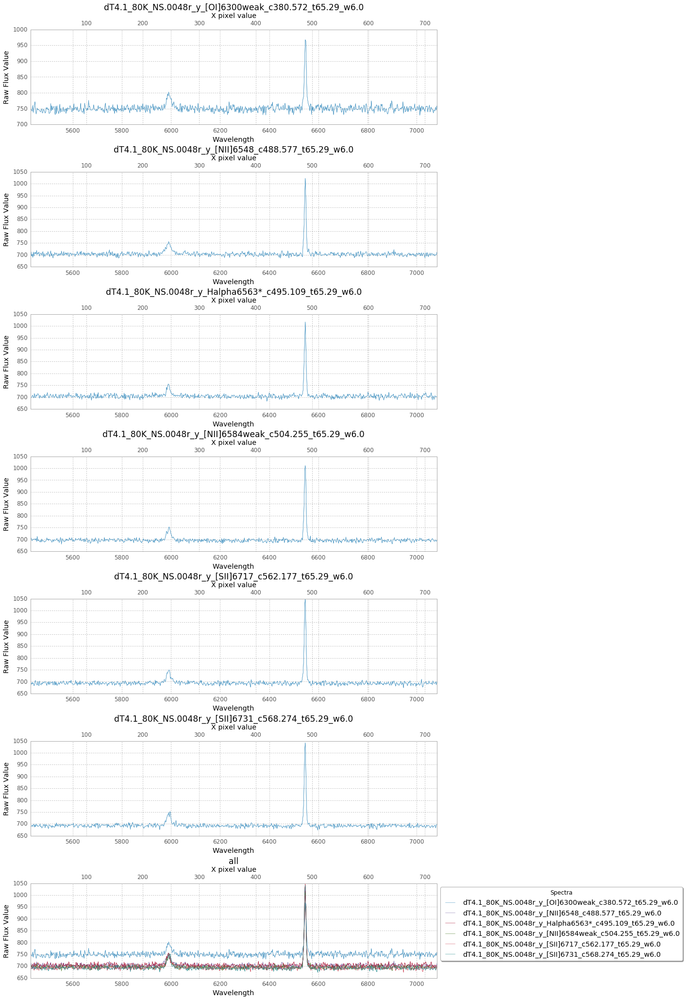

In [49]:
n=0
for dT_image_r, dFT_image_r, dT_image_b, dFT_image_b in zip(dTImages_r[n:],dFTImages_r[n:],dTImages_b[n:],dFTImages_b[n:]):
    image = dT_image_r #dTImages_b[3]
    #     image = dT_image_b
    #     image = dFT_image_r
    #     image = dFT_image_b
#     image_to_write = dT_image_b

    channel = image[-1]
    dir_ = '/Users/amielpatton-hall/Desktop/Research/Levesque/NGC6946/data2.0/apall4_y/'
    full_region = [1,2098,1,1078]
    center_width = 10
    trace_center = 0       #initially set before know value.

    trim_region_r=[15,1920,99,819]
    full_lowest_r=83.5
    full_highest_r=834.5

    trim_region_b=[210,1990,210,888]
    full_lowest_b=195
    full_highest_b=903.5

    if channel == 'r':
        trace_center = 65.29
        trim_region = trim_region_r
        full_lowest = full_lowest_r
        full_highest = full_highest_r
        w1 =  5428.431 #starting wavelength
        w2 =  9802.673 #ending wavelength
        dw =  2.29619 #wavelength intervel per pixel
        nw =  1906 #number of output pixels

    if channel == 'b':
        trace_center = 1458.02
        trim_region = trim_region_b
        full_lowest = full_lowest_b
        full_highest = full_highest_b
        w1 =  2926.267 #starting wavelength
        w2 =  6165.38 #ending wavelength
        dw =  1.819726 #wavelength intervel per pixel
        nw =  1781 #number of output pixels

    trim_base_vs_transfer_fit = [0.94335225214255913, 0.81555279062263253]
    c1,c2 = trim_base_vs_transfer_fit

    T = SlitSpectra(image=image,
           channel=channel,
           path=dir_,
           full_region=full_region,
           trim_region=trim_region,
           direction='y',
           full_lowest=full_lowest,
           full_highest=full_highest,
           trace_center=trace_center,
           SN_width=center_width,
           w1=w1,w2=w2,dw=dw)

    #blue channel
    # [OII] 3727*
    # [OIII] 4363 (weak)
    # He II 4686 (weak)
    # Hbeta 4861*
    # [OIII] 4959
    # [OIII] 5007*
    
    #red channel
    # [OI] 6300 (weak)
    # [NII] 6548
    # Halpha 6563*
    # [NII] 6584 (weak)
    # [SII] 6717
    # [SII] 6731
    
    wavelength_widths = [6,6,6,6,6,6]

    if channel == 'b':
        wavelengths = [3727, 4363, 4686, 4861, 4959, 5007]   #"blue" wavelengths
        wavelength_names = [r'[OII]3727*', r'[OIII]4363weak', r'HeII4686weak', r'Hbeta4861*', r'[OIII]4959',r'[OIII]5007*'] #first half
        wavelength_widths = [6,6,6,6,6,6]
        
    if channel == 'r':
        wavelengths = [6300, 6548, 6563, 6584, 6717, 6731]     #red wavelengths
        wavelength_names = [r'[OI]6300weak',r'[NII]6548',r'Halpha6563*',r'[NII]6584weak',r'[SII]6717',r'[SII]6731']
        wavelength_widths = [6,6,6,6,6,6]
    
    pixel_backgrounds = []

    it_ = 0
    while it_ < len(wavelengths):
        pixel_backgrounds.append([-7,-5,5,7])
        it_ = it_ +1

    #if y:
    T.calculateWavelengths(wavelength_names, wavelengths, wavelength_widths, pixel_backgrounds, verbose=False)
    T.plotImageWavelength(save_fig=True,verbose=False)
    
    if channel == 'r':
        T.plotImageWavelength(x=[250,700],save_fig=True,verbose=False)
#         T.plotImageWavelength(x=[450,550],save_fig=True,verbose=False)
    if channel == 'b':
        T.plotImageWavelength(x=[600,1300],save_fig=True,verbose=False)
    
#     T.buildotherdatabase(image_to_write=image_to_write,verbose=True)
#     T.buildbasedatabase(verbose=True, database_source=None)    #careful
#     T.builddatabase(verbose=True)      #careful (not completely fool-proof)

    T.plotSpectra(verbose=False)
#     T.finalizeFiles(verbose=True)

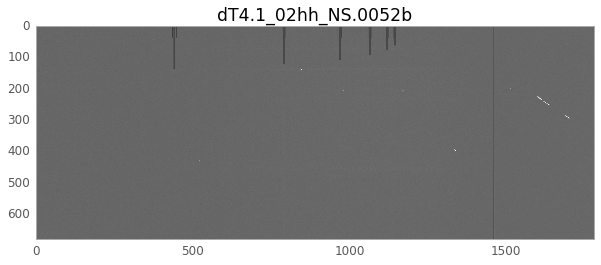

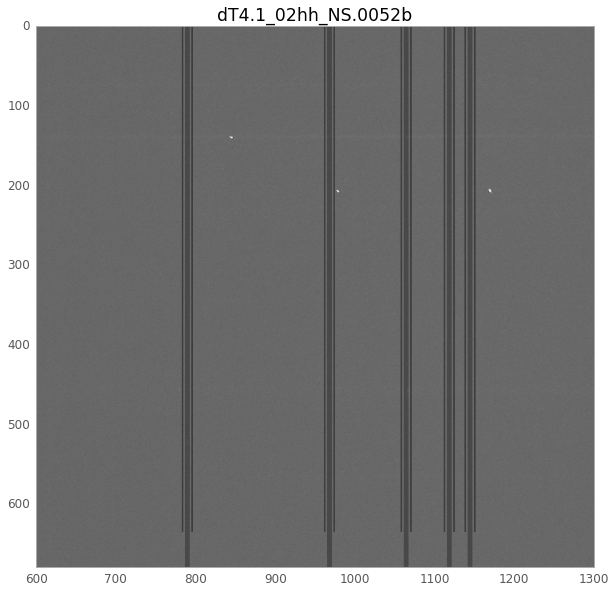

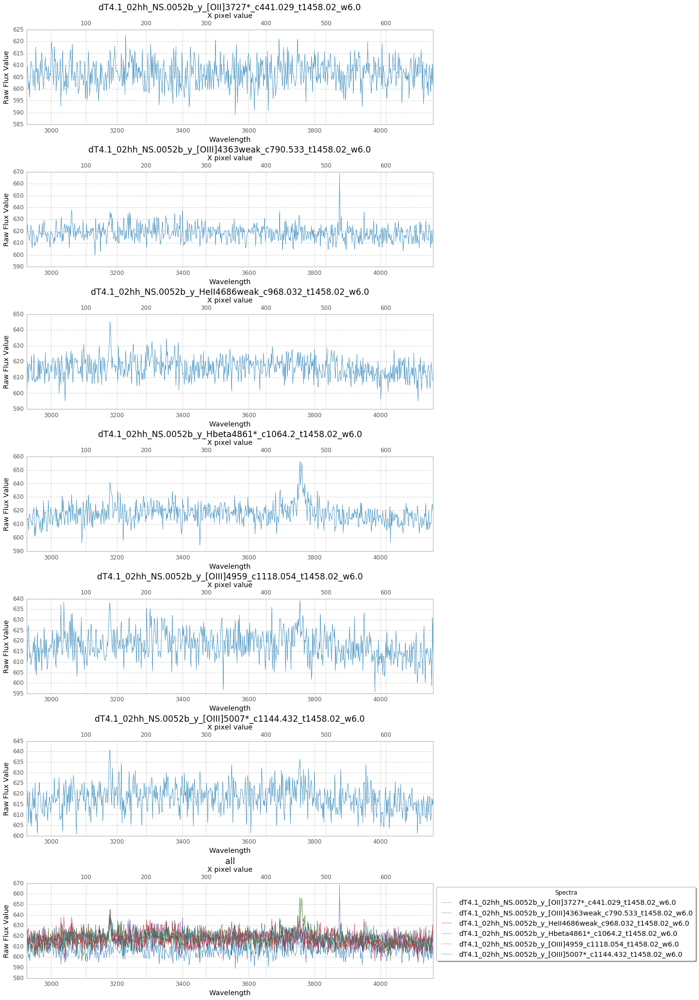

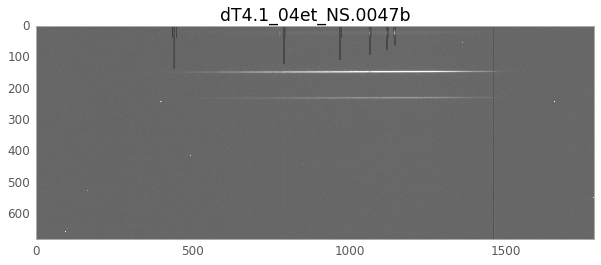

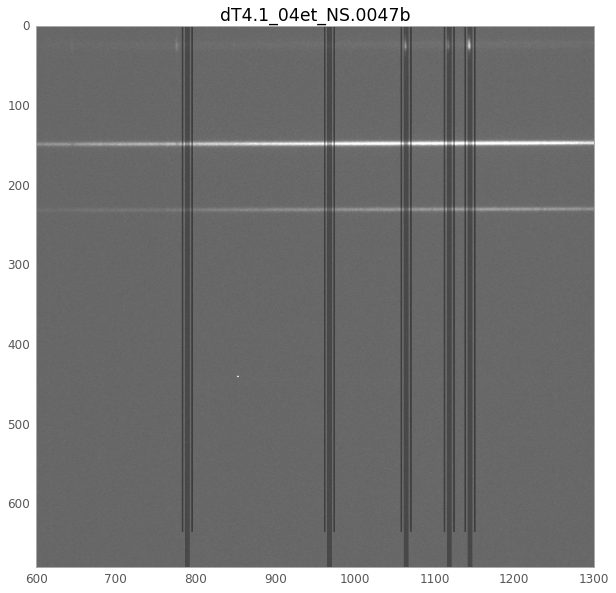

...

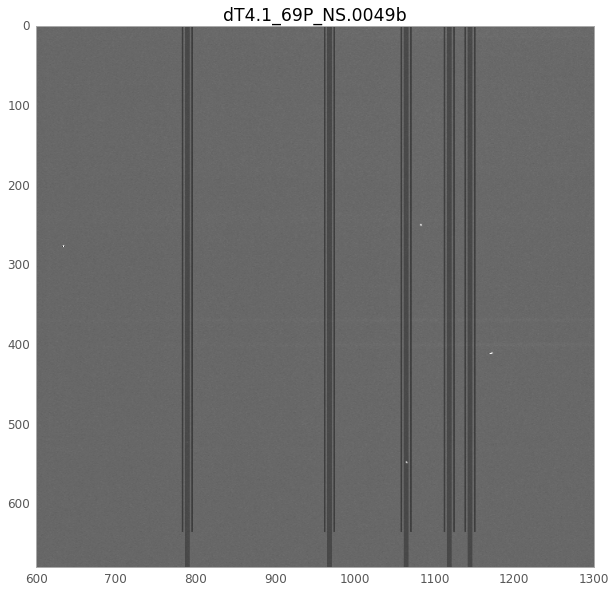

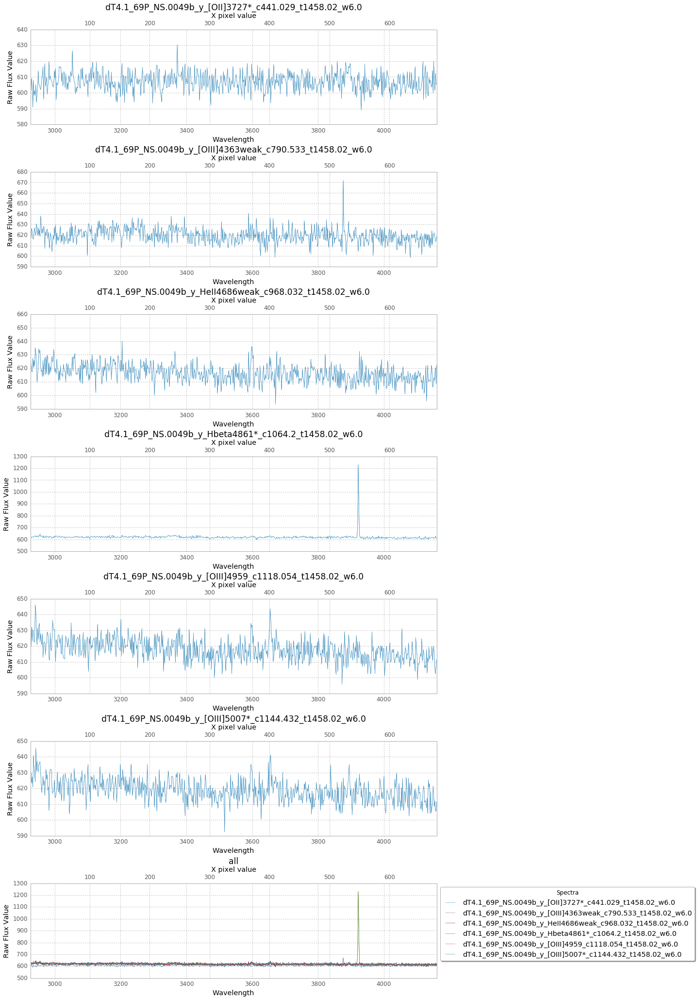

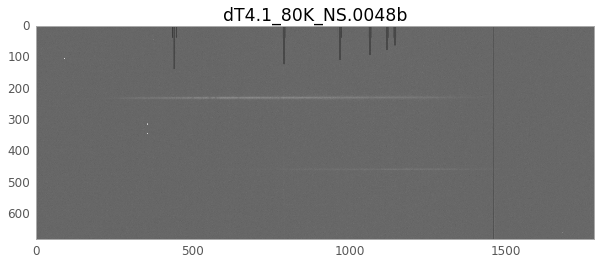

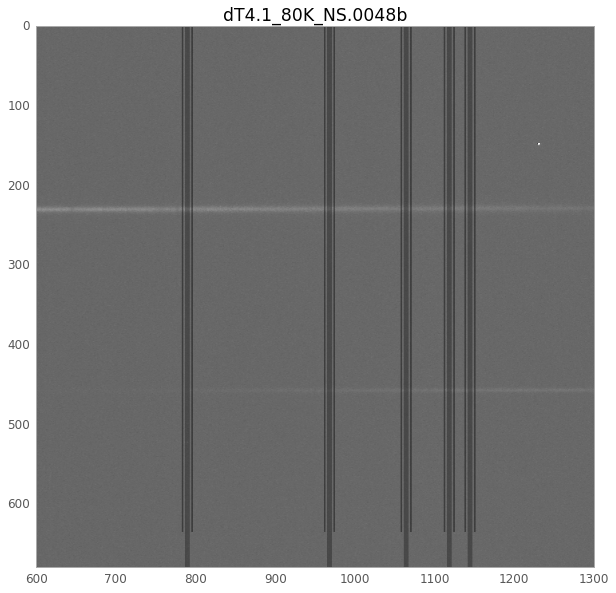

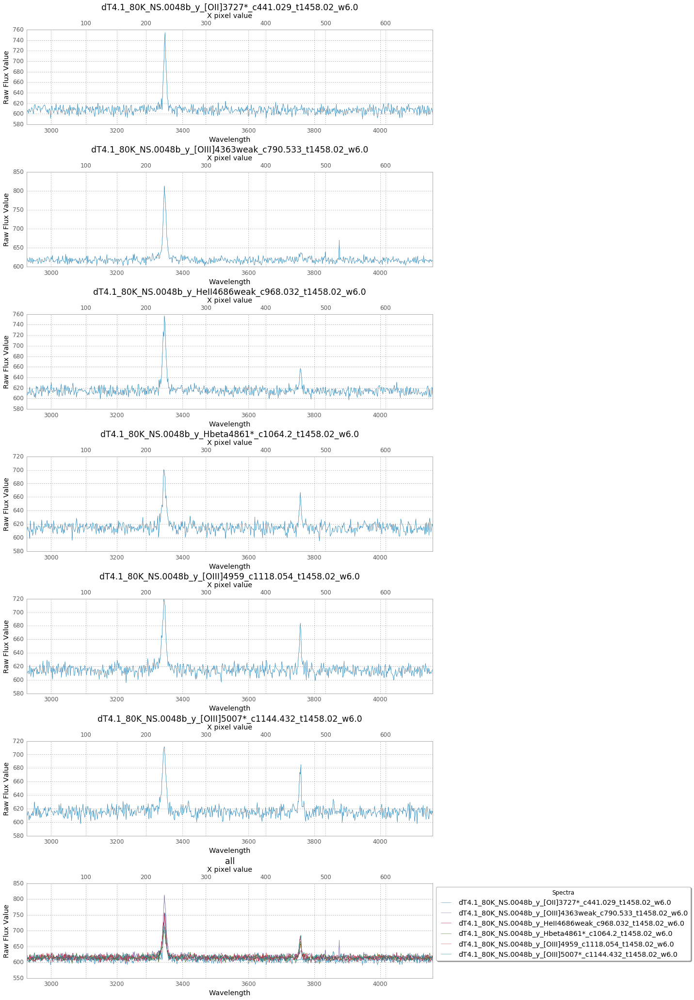

In [48]:
n=0
for dT_image_r, dFT_image_r, dT_image_b, dFT_image_b in zip(dTImages_r[n:],dFTImages_r[n:],dTImages_b[n:],dFTImages_b[n:]):
    image = dT_image_b #dTImages_b[3]
    #     image = dT_image_b
    #     image = dFT_image_r
    #     image = dFT_image_b
    image_to_write = dT_image_b

    channel = image[-1]
    dir_ = '/Users/amielpatton-hall/Desktop/Research/Levesque/NGC6946/data2.0/apall4_y/'
    full_region = [1,2098,1,1078]
    center_width = 10
    trace_center = 0       #initially set before know value.

    trim_region_r=[15,1920,99,819]
    full_lowest_r=83.5
    full_highest_r=834.5

    trim_region_b=[210,1990,210,888]
    full_lowest_b=195
    full_highest_b=903.5

    if channel == 'r':
        trace_center = 65.29
        trim_region = trim_region_r
        full_lowest = full_lowest_r
        full_highest = full_highest_r
        w1 =  5428.431 #starting wavelength
        w2 =  9802.673 #ending wavelength
        dw =  2.29619 #wavelength intervel per pixel
        nw =  1906 #number of output pixels

    if channel == 'b':
        trace_center = 1458.02
        trim_region = trim_region_b
        full_lowest = full_lowest_b
        full_highest = full_highest_b
        w1 =  2926.267 #starting wavelength
        w2 =  6165.38 #ending wavelength
        dw =  1.819726 #wavelength intervel per pixel
        nw =  1781 #number of output pixels

    trim_base_vs_transfer_fit = [0.94335225214255913, 0.81555279062263253]
    c1,c2 = trim_base_vs_transfer_fit

    T = SlitSpectra(image=image,
           channel=channel,
           path=dir_,
           full_region=full_region,
           trim_region=trim_region,
           direction='y',
           full_lowest=full_lowest,
           full_highest=full_highest,
           trace_center=trace_center,
           SN_width=center_width,
           w1=w1,w2=w2,dw=dw)

    #blue channel
    # [OII] 3727*
    # [OIII] 4363 (weak)
    # He II 4686 (weak)
    # Hbeta 4861*
    # [OIII] 4959
    # [OIII] 5007*
    
    #red channel
    # [OI] 6300 (weak)
    # [NII] 6548
    # Halpha 6563*
    # [NII] 6584 (weak)
    # [SII] 6717
    # [SII] 6731
    
    wavelength_widths = [6,6,6,6,6,6]

    if channel == 'b':
        wavelengths = [3727, 4363, 4686, 4861, 4959, 5007]   #"blue" wavelengths
        wavelength_names = [r'[OII]3727*', r'[OIII]4363weak', r'HeII4686weak', r'Hbeta4861*', r'[OIII]4959',r'[OIII]5007*'] #first half
        wavelength_widths = [6,6,6,6,6,6]
        
    if channel == 'r':
        wavelengths = [6300, 6548, 6563, 6584, 6717, 6731]     #red wavelengths
        wavelength_names = [r'[OI]6300weak',r'[NII]6548',r'Halpha6563*',r'[NII]6584weak',r'[SII]6717',r'[SII]6731']
        wavelength_widths = [6,6,6,6,6,6]
    
    pixel_backgrounds = []

    it_ = 0
    while it_ < len(wavelengths):
        pixel_backgrounds.append([-7,-5,5,7])
        it_ = it_ +1

    #if y:
    T.calculateWavelengths(wavelength_names, wavelengths, wavelength_widths, pixel_backgrounds, verbose=False)
    T.plotImageWavelength(save_fig=True,verbose=False)
    
    if channel == 'r':
        T.plotImageWavelength(x=[250,700],save_fig=True,verbose=False)
#         T.plotImageWavelength(x=[450,550],save_fig=True,verbose=False)
    if channel == 'b':
        T.plotImageWavelength(x=[600,1300],save_fig=True,verbose=False)
    
#     T.buildotherdatabase(image_to_write=image_to_write,verbose=True)
#     T.buildbasedatabase(verbose=True, database_source=None)    #careful
#     T.builddatabase(verbose=True)      #careful (not completely fool-proof)

    T.plotSpectra(verbose=False)
#     T.finalizeFiles(verbose=True)

#if x:
# T.findcenterwidthBackground(verbose=True)
# T.allcalc(verbose=False)

#     T.buildotherdatabase(image_to_write=image_to_write,verbose=True)

#     values_in_r = [125.11111,255.66667,344.55556]
#     values_in_b = [234.21605,357.67284,440.62037]

#     T.buildothercoordinatefile(transfer_image_to_write=image_to_write, 
#                              base_channel_points=values_in_r,
#                              transfer_channel_points=values_in_b,
#                              transfer_full_lowest=full_lowest_b,
#                              transfer_full_highest=full_highest_b,
#                              transfer_trim_region=trim_region_b,
#                              verbose=True)

#     T.findcenterwidthBackground(verbose=True)
#     T.allcalc(verbose=True)

#     T.buildbasedatabase(verbose=True, database_source=None)    #careful
#     T.builddatabase(verbose=True)      #careful (not completely fool-proof)

#     T.plotSpectra(x=[6000,7000],save_fig=True,verbose=False)
#     T.plotSpectra(x=[4750,5750],save_fig=True,verbose=False)
#     T.plotSpectra(verbose=False)

#     T.plotImage(save_fig=True,verbose=False)
#     if channel == 'b':
#         T.plotImage(x=[1000,1200],save_fig=True,verbose=False)  #b Signal in b
#     if channel == 'r':
#         T.plotImage(x=[330,700],save_fig=True,verbose=False)  #r Signal in r - Halpha Group

#     T.finalizeFiles(verbose=True)


#     print ''
#     !cat $dir_/database/\ap$image |wc
#     !cat $dir_/database/\ap$image
#     print '' ; print ''

In [38]:
import numpy as np
from astropy.table import Table

class SlitSpectra:
    """
    Container for slit spectra images being used inside apall.
    """
    def __init__(self, image, channel, path,
                 full_region, trim_region,
                 direction, full_lowest, full_highest,
                 trace_center, SN_width,
                 w1, w2, dw, direction_boolian=None):
        """
        Parameters
        ----------
        image : string
            Name of the slit spectra image fits
        channel : string
            Name of the channel b or r
        full_region : array-like
            image origional region [x1, x2, y1, y2]
        trim_region : array-like
            image origional region [x1, x2, y1, y2]
        direction : array-like
            direction of extraction - x or y direction
        full_lowest : array-like
            lower start of spectra in full region
        full_highest : array-like
            upper end of spectra in full region
        trace_center : array-like
            Center of trace in pixels
        extract_centers : array-like
            Centers of extraction in pixels
        extract_widths : array-like
            Widths of extraction in pixels
        builtdatabase : boolian
            True or False, whether or not initial database has been built for image
        w1 : float
            starting wavelength - from calibration
        w2 : float
            ending wavelength - from calibration
        dw : float
            wavelength intervel per pixel - from calibration
        """
        self.image = image
        self.channel = channel
        self.path = path
        self.direction = direction
        
        #defining direction as x = 0 and y = 1
        if direction_boolian == None:
            if self.direction == 'x':
                #checking for x direction
                self.direction_boolian = 0
            elif self.direction == 'y':
                #checking for y direction
                self.direction_boolian = 1
            else:
                #defaults to x direction
                self.direction_boolian = 0

        self.full_region = full_region
        self.full_lowest = full_lowest
        self.full_highest = full_highest
        self.trim_region = trim_region
        
        self.trace_center = trace_center
        
        self.w1 = w1
        self.w2 = w2
        self.dw = dw
        
        self.SN_center = None
        self.SN_width = SN_width #(previously center_width)
        self.SN_upper = None
        self.SN_lower = None
        self.SN_name = None
        self.SN_background = None
        
        self.extract_centers = None #(previously extract_center)
        self.extract_widths = None #(previously extract_width)
        self.extract_uppers = None
        self.extract_lowers = None
        self.extract_names = None
        self.extract_backgrounds = None
        
        #only used when inputing background from a txt file
        self.b1 = None
        self.b2 = None
        self.b3 = None
        self.b4 = None
        
        self.center = None
        self.width = None
        self.upper = None
        self.lower = None
        self.name = None
        self.background = None
        self.spectra = None
        
        self.n_apertures = 1
        
        self.builtdatabase = False
        
        self.t = None #file save date
        
        self.full_base_vs_transfer_fit = None
        self.trim_base_vs_transfer_fit = None
        
        self.full_base_vs_transfer_fit = None
        self.trim_base_vs_transfer_fit = None

    def freakout(self):
        import this
        print self.image, 'will not win forever.'
        del this

    def getinfo(self):
        """
        Prints current input info.
        """
        print '>'*3,self.channel,self.image,'<'*3
        print ''
        for i_,n_ in [['image',self.image],
                    ['channel',self.channel],
                    ['full_region',self.full_region],
                    ['trim_region',self.trim_region],
                    ['direction',self.direction],
                    ['full_lowest',self.full_lowest],
                    ['full_highest',self.full_highest],
                    ['trace_center',self.trace_center],
                    ['SN_width',self.SN_width], #new - works
                    ['extract_centers',self.extract_centers],
                    ['extract_widths',self.extract_widths]]:
            print '{i:<20}{n:<30}'.format(i=i_,n=n_)
        print ''
        
        
    def findcenterwidthBackground(self,verbose=True):
        """
        Takes input txt file with above and below aperture coordinates (in trimmed region) and background regions, in order from top of image to bottom of image, and generates extract_centers, extract_widths and background.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        #finds the width of aperture extraction using the input top and bottom of extraction
        width_func = lambda top,bot : round(top-bot,3)
        #find the center of aperture extraction using the input top and bottom of extraction
        center_func = lambda top,bot : round((top+bot)*.5,3)
        
        #printing readin file name and readin info.
        if verbose:
            print '>'*3,self.channel,self.image,'<'*3
            print ''
            print 'read in location: ', self.path+self.image+'_coords.txt'
            print ''
        
        #reading in coordinate file in form path imagename _coords.txt
        T = Table.read(self.path+self.image+'_coords.txt',format='ascii')
        
        #determining which direction to read in file. If x, then we want y column, col2.
                                                     #If y, then we want x column, col1.
        if self.direction_boolian == 1:
            col = 'col2'
        elif self.direction_boolian == 0:
            col = 'col1'
        
        #upper & lower side of apertures named highr_apertures & lower_apertures and 1st & 2nd to be read in
        highr_apertures = list(T[col][0::6])
        lower_apertures = list(T[col][1::6])
        
        #background locations of apetrues 3rd, 4th, 5th, 6th to be read in.
        self.b1 = list(T[col][2::6])
        self.b2 = list(T[col][3::6])
        self.b3 = list(T[col][4::6])
        self.b4 = list(T[col][5::6])
        
        #finding extract centers and extract widths using center_func and width_func defined above
        self.extract_centers = map(center_func, highr_apertures, lower_apertures)
        self.extract_widths = map(width_func, highr_apertures, lower_apertures)
        
        #defining nuber of apertures. Note that the +1 is the aperture automatically built at the center of the image.
        self.n_apertures = len(self.extract_centers)+1
        
        #printing resulting apertures for reference to user if verbose.
        if verbose:
            print 'ap highs:', highr_apertures
            print 'ap lows: ', lower_apertures
            print 'center:', self.extract_centers
            print 'width: ', self.extract_widths
            print 'back 1:', self.b1
            print 'back 2:', self.b2
            print 'back 3:', self.b3
            print 'back 4:', self.b4
            print 'n ap:  ', self.n_apertures
            print ''

        #Checking they're in order Note that backgrounds later ordered as input, but upper and lower must be in correct direction
        i=1
        while i<self.n_apertures-1:
            if self.extract_centers[i-1]<self.extract_centers[i]:
                print 'problem at:', self.extract_centers[i]
            i+=1

        #this variable is for determining background input method (equation or from file)
        self.fileBackground = True

    def findcenterwidth(self,verbose=True):
        """
        Takes input txt file with above and below aperture coordinates (in trimmed region), in order from top of image to bottom of image, and generates extract_centers, extract_widths.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        
        #finds the width of aperture extraction using the input top and bottom of extraction
        width_func = lambda top,bot : round(top-bot,3)
        #find the center of aperture extraction using the input top and bottom of extraction
        center_func = lambda top,bot : round((top+bot)*.5,3)

        #printing readin file name and readin info.
        if verbose:
            print '>'*3,self.channel,self.image,'<'*3
            print ''
            print 'read in location: ', self.path+self.image+'_coords.txt'
            print ''
        T = Table.read(self.path+self.image+'_coords.txt',format='ascii')
        
        highr_apertures = list(T['col2'][0::2])
        lower_apertures = list(T['col2'][1::2])
        
        self.extract_centers = map(center_func, highr_apertures, lower_apertures)
        self.extract_widths = map(width_func, highr_apertures, lower_apertures)
        self.n_apertures = len(self.extract_centers)+1
        
        if verbose:
            print 'ap highs:', highr_apertures
            print 'ap lows: ', lower_apertures
            print 'center:', self.extract_centers
            print 'width: ', self.extract_widths
            print 'n ap:  ', self.n_apertures
            print ''
        
        #Checking they're in order
        i=1
        while i<self.n_apertures-1:
            if self.extract_centers[i-1]<self.extract_centers[i]:
                print 'problem at:', self.extract_centers[i]
            i+=1

        self.fileBackground = False

        
        
    def calculateWavelengths(self, wavelength_names, wavelengths, pixel_widths, pixel_backgrounds, verbose=False):
        """
        Takes wavelengths and their pixel backgrounds and widths as input and defines extract_centers, extract_widths, background values b1, b2, b3, b4.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        
        #TODO: restrict wavelengths to those between w1 and w2
        
        
#         wavelengths_within_range_index = []
        
#         for it_,wave_ in enumerate(wavelengths):
#             wavelength_test = (wave_ > self.w1) & (wave_ < self.w2)
#             wavelengths_within_range_index.append(it_)
        
#         print wavelengths_within_range_index
        
#         wavelengths = wavelengths[wavelengths_within_range_index]
        
        self.wavelengths = wavelengths
        self.wavelength_names = wavelength_names
        
        #building background b1 - b4  Note: they are in pixel while wavelengths are in angstroms
        self.b1 = None
        self.b2 = None
        self.b3 = None
        self.b4 = None
        
        #inputs wavelength and outputs pixel
        pixel = lambda wave,w1,dw : round((wave - w1)/dw + 1,3)
        
        #transfering all values to pixel from wavelength.
        wavelength1 = np.empty(len(wavelengths))
        wavelength1.fill(self.w1)
        delta_wavelength = np.empty(len(wavelengths))
        delta_wavelength.fill(self.dw)
        
        self.extract_centers = map(pixel, wavelengths, wavelength1, delta_wavelength)
        self.extract_widths = pixel_widths
#extract_backgrounds defined
        background_func = lambda b1234_,center,trace : np.sort([round(b1234_[0]+center-trace,2),round(b1234_[1]+center-trace,2),
                                                         round(b1234_[2]+center-trace,2),round(b1234_[3]+center-trace,2)])
        self.extract_backgrounds = [background_func(ap_background_,center_,self.trace_center) 
                                        for ap_background_,center_ in zip(pixel_backgrounds,self.extract_centers)]
        
        #defining nuber of apertures.
        self.n_apertures = len(self.extract_centers)
        
        #printing resulting apertures for reference to user if verbose.
        if verbose:
            print 'wavelengths:', wavelengths
            print 'pixel_widths: ', pixel_widths
            print 'pixel_backgrounds:', pixel_backgrounds
            print 'centers: ', self.extract_centers
            print 'width: ', self.extract_widths
            print 'back 1:', self.b1
            print 'back 2:', self.b2
            print 'back 3:', self.b3
            print 'back 4:', self.b4
            print 'n ap:  ', self.n_apertures
            print ''

        
        g = lambda x,y:x-y+1

        def norm_region(trim_region):
            new_region = map(g, trim_region, [trim_region[0],trim_region[0],trim_region[2],trim_region[2]])
            return new_region

        def transfer_coord(value,x_or_y,trim_region):
            newcoord_value = g(value,trim_region[2*x_or_y])
            return newcoord_value
        
        #lowest point of data in trimmed coordinate
        new_lowest = transfer_coord(self.full_lowest,1,self.trim_region)
        #highest point of data in trimmed coordinate
        new_highest = transfer_coord(self.full_highest,1,self.trim_region)
        
        #dimensins of trim region
        new_region = norm_region(self.trim_region)
        
        def findname(image,direction,wavelength_name,center,trace_center,width):
            return str(image)+'_'+str(direction)+'_'+str(wavelength_name)+'_c'+str(center)+'_t'+str(trace_center)+'_w'+ str(round(width,2))
        
#extract_uppers defined
#extract_lowers defined
#extract_names defined

        self.extract_lowers = map(lambda cen,wid : cen-wid/2-self.trace_center, self.extract_centers, self.extract_widths)
        self.extract_uppers = map(lambda cen,wid : cen+wid/2-self.trace_center, self.extract_centers, self.extract_widths)
        
        self.extract_names = [ findname(self.image,self.direction,wave_,c_,self.trace_center,w_) for wave_,c_,w_ in zip(self.wavelength_names,self.extract_centers,self.extract_widths)]

        #note this re-defining is due to the extra SN center placed inside the x
        self.center = self.extract_centers
        self.width = self.extract_widths
        self.lower = self.extract_lowers
        self.upper = self.extract_uppers
        self.name = self.extract_names
        self.background = self.extract_backgrounds
        
        #generating apertures file
        import sys
        
        def printlen(string,length):
            print ('{i:<%s}' % str(length) ).format(i = string),
            
        orig_stdout = sys.stdout
        f = open(self.path + self.image + '_apertures.txt', 'w')
        sys.stdout = f
        
        print '>'*3,self.channel,self.image,'<'*3
        print ''
        print 'Regions'
        for i_region,i_xy in zip(['full','trim','new'],
                                 [self.full_region, self.trim_region, new_region]):
            printlen(i_region,10); printlen(i_xy,25)
            print ''

        print ''
        print 'Line Spectra Data Limits'
        for r_,l_,u_,xy_ in zip(['region','full','new'],
                                   ['low',self.full_lowest,new_lowest],
                                   ['high',self.full_highest,new_highest],
                                   ['X1:X2,Y1:Y2',self.full_region,new_region]):
            printlen(r_,10); printlen(l_,10); printlen(u_,10); printlen(xy_,25)
            print ''

        print ''
        print 'Apertures to Extract in apall'

        def printApall(i,t,c,w,l,u,n,b):
            printlen(i,20); printlen(n,30); print '';
            printlen(t,10); printlen(c,10); printlen(w,10); printlen(l,10); printlen(u,10); printlen(b,20); print ''

        printApall('image','trace','center','width','lower','upper','file name','background')

        for c_,w_,l_,u_,n_,b_ in zip(self.center, self.width, self.lower, self.upper, self.name, self.background):
            printApall(self.image,self.trace_center, c_,w_,l_,u_,n_,b_)
            
        f.close()        
        sys.stdout = orig_stdout
        del sys
        
        if verbose == True:
            f = open(self.path+self.image + '_apertures.txt', 'r')
            listName = [line.rstrip() for line in f]
            for line in listName:
                print line
            print ''
            f.close()
            
                 
    def plotImageWavelength(self, save_fig=False, verbose=True, x=None, y=None, vmin=0, vmax=250):
        
        """
        Plots the centers and their apertures of image.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        
        import matplotlib.pyplot as plt
        from astropy.visualization import astropy_mpl_style
        plt.style.use(astropy_mpl_style)
        from astropy.io import fits        
        
        open_image = fits.open(self.path+self.image+'.fits')
        if verbose:
            print open_image.info()
        image_data = open_image[0].data
        open_image.close()
        
        #determining where end of markings will be
        center_end = 50
        back_end = 40
        
        if x != None:
            center_end = int(x[0] + (x[1]-x[0])*.1)
            back_end = int(x[0] + (x[1]-x[0])*.05)
            
        #marking trace_center
        trace = self.trace_center
        image_data[:,int(trace-1):int(trace+1)] *= .8
#HERE
        #marking image with centers
        for i in range(self.n_apertures):
            cen = self.center[i]
            wid = self.width[i]
            image_data[0:center_end+15*(self.n_apertures - i),int(cen-wid/2):int(cen+wid/2)] *=.7
            
            b1,b2,b3,b4 = [b + trace for b in self.background[i]]
            image_data[0:back_end,int(b1):int(b2)] *=.6
            image_data[0:back_end,int(b3):int(b4)] *=.6
    
        fig,ax = plt.subplots(1,1)
        fig.set_size_inches(10,10)
        ax.imshow(image_data, cmap='gray',vmin=vmin, vmax=vmax)
        if x != None:
            ax.set_xlim(x[0],x[1])
        if y != None:
            ax.set_ylim(y[0],y[1])
        ax.grid()  #takes away grid
        ax.set_title(self.image)
        fig.show()
          
        del plt
        del astropy_mpl_style
        del fits
        
        if save_fig:
            import os
            directory = self.path+'/plots/'
            if not os.path.exists(directory):
                os.makedirs(directory)
            
            filenameend = '.jpg'
            if x != None:
                filenameend = '_x'+str(x[0])+':'+str(x[1])+'.jpg'
                
            fig.savefig(directory+self.image+'_apertureplot'+filenameend, bbox_inches='tight')
            del os
            
            
            
            
            
        
    def allcalc(self,verbose=True):
        """
        Calculates the lowers, uppers, centers, names, etc (in the trim regions) for entrance into apall, and generates txt file with these values.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        g = lambda x,y:x-y+1

        def norm_region(trim_region):
            new_region = map(g, trim_region, [trim_region[0],trim_region[0],trim_region[2],trim_region[2]])
            return new_region

        def transfer_coord(value,x_or_y,trim_region):
            newcoord_value = g(value,trim_region[2*x_or_y])
            return newcoord_value

        #center of data inside full region (SN)
        full_center = (self.full_lowest+self.full_highest)/2
        #center of data inside trim region (SN)
        new_center = transfer_coord(full_center,1,self.trim_region)
        
#SN_center defined

        self.SN_center = new_center
        
        #lowest point of data in trimmed coordinate
        new_lowest = transfer_coord(self.full_lowest,1,self.trim_region)
        #highest point of data in trimmed coordinate
        new_highest = transfer_coord(self.full_highest,1,self.trim_region)
        
        #dimensins of trim region
        new_region = norm_region(self.trim_region)
        
        def findname(image,direction,center,trace_center,width):
            return str(image)+'_'+str(direction)+'_c'+str(center)+'_t'+str(trace_center)+'_w'+ str(round(width,2))
        
#extract_uppers defined
#extract_lowers defined
#extract_backgrounds defined
#extract_names defined

        self.extract_lowers = [(x-y/2)-self.trace_center for x,y in zip(self.extract_centers,self.extract_widths)]
        self.extract_uppers = [(x+y/2)-self.trace_center for x,y in zip(self.extract_centers,self.extract_widths)]
        
        if self.fileBackground == True:
            background_func = lambda b1,b2,b3,b4,center : np.sort([round(b1-center,2),round(b2-center,2),
                                                                   round(b3-center,2),round(b4-center,2)])
            self.extract_backgrounds = [background_func(b1,b2,b3,b4,self.trace_center) 
                                        for b1,b2,b3,b4 in zip(self.b1,self.b2,self.b3,self.b4)]
            
        else:
            self.extract_backgrounds = [[round(l_,2)-8,round(l_,2)-3,round(u_,2)+3,round(u_,2)+8] 
                                        for l_,u_ in zip(self.extract_lowers,self.extract_uppers)]
            
        self.extract_names = [ findname(self.image,self.direction,c_,self.trace_center,w_) for c_,w_ in zip(self.extract_centers,self.extract_widths)]
                
#SN_upper defined
#SN_lower defined
#SN_background defined
#SN_name defined

        self.SN_lower = self.SN_center-self.SN_width/2 - self.trace_center
        self.SN_upper = self.SN_center+self.SN_width/2 - self.trace_center
        self.SN_background = [round(self.SN_lower,2)-8,round(self.SN_lower,2)-3,round(self.SN_upper,2)+3,round(self.SN_upper,2)+8]
        self.SN_name = findname(self.image,self.direction,self.SN_center,self.trace_center,self.SN_width)
        
        self.center = np.insert(self.extract_centers,0,self.SN_center)
        self.width = np.insert(self.extract_widths,0,self.SN_width)
        self.lower = np.insert(self.extract_lowers,0,self.SN_lower)
        self.upper = np.insert(self.extract_uppers,0,self.SN_upper)
        self.name = np.insert(self.extract_names,0,self.SN_name)
        
        background = []
        background.append(self.SN_background)
        for b in self.extract_backgrounds:
            background.append(b)
        self.background = background
        
        #generating apertures file
        import sys
        
        def printlen(string,length):
            print ('{i:<%s}' % str(length) ).format(i = string),
            
        orig_stdout = sys.stdout
        f = open(self.path + self.image + '_apertures.txt', 'w')
        sys.stdout = f
        
        print '>'*3,self.channel,self.image,'<'*3
        print ''
        print 'Regions'
        for i_region,i_xy in zip(['full','trim','new'],
                                 [self.full_region, self.trim_region, new_region]):
            printlen(i_region,10); printlen(i_xy,25)
            print ''

        print ''
        print 'Line Spectra Data Limits'
        for r_,c_,l_,u_,xy_ in zip(['region','full','new'],
                                   ['center',full_center,self.SN_center],
                                   ['low',self.full_lowest,new_lowest],
                                   ['high',self.full_highest,new_highest],
                                   ['X1:X2,Y1:Y2',self.full_region,new_region]):
            printlen(r_,10); printlen(c_,10); printlen(l_,10); printlen(u_,10); printlen(xy_,25)
            print ''

        print ''
        print 'Apertures to Extract in apall'

        def printApall(i,t,c,w,l,u,n,b):
            printlen(i,20); printlen(n,30); print '';
            printlen(t,10); printlen(c,10); printlen(w,10); printlen(l,10); printlen(u,10); printlen(b,20); print ''

        printApall('image','trace','center','width','lower','upper','file name','background')

        for c_,w_,l_,u_,n_,b_ in zip(self.center, self.width, self.lower, self.upper, self.name, self.background):
            printApall(self.image,self.trace_center, c_,w_,l_,u_,n_,b_)
            
        f.close()        
        sys.stdout = orig_stdout
        del sys
        
        if verbose == True:
            f = open(self.path+self.image + '_apertures.txt', 'r')
            listName = [line.rstrip() for line in f]
            for line in listName:
                print line
            print ''
            f.close()

    def buildbasedatabase(self,database_source=None,verbose=True):
        """
        Generates a file of the form database/ap+image for first aperture only. It uses database/"database_source" to build the single aperture base file, unless database_source is defined. The base file is then run inside apall, and the correct trace can be found. Then builddatabase() takes the corrected base file to copy trace to all apertures.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        if database_source == None:
            database_source = 'ap'+self.image
        
        #this is a file, simply used to generate fundamental settings (for use to make image-specific files)
        with open(self.path+'database/'+database_source, 'r') as file:
            data_basefile = file.readlines()
        
        #building baseline aperture for self.image (for use to build correct trace for all images)
        with open(self.path+'database/ap'+self.image, 'w') as file:
                data = data_basefile
                data[1]="begin	aperture "+self.image+" 1 1225. "+str(self.trace_center)+'\n'
                data[2]="	image	"+self.image+'\n'
                data[3]="	aperture	1"+'\n'
                data[4]="	beam	1"+'\n'
                
                if self.direction == 'y':
                    data[5]="	center	"+str(self.trace_center)+' 360.'+'\n'
                    data[6]="	low	"+str(self.lower[0])+' -359.'+'\n'
                    data[7]="	high	"+str(self.upper[0])+' 361.'+'\n'
                elif self.direction == 'x':
                    data[5]="	center	"+str(self.trace_center)+' 360.'+'\n'
                    data[6]="	low	"+str(self.lower[0])+' -359.'+'\n'
                    data[7]="	high	"+str(self.upper[0])+' 361.'+'\n'
#                     	low	310.1536 -359.
#                         high	318.3105 317.282
#                     data[5]="	center	1225. "+str(self.trace_center)+'\n'
#                     data[6]="	low	-1224. "+str(self.lower[0])+'\n'
#                     data[7]="	high	681. "+str(self.upper[0])+'\n'
                    
#                 data[5]="	center	1225. "+str(self.trace_center)+'\n'
#                 data[6]="	low	-1224. "+str(self.lower[0])+'\n'
#                 data[7]="	high	681. "+str(self.upper[0])+'\n'
                b = self.background[0]
                data[13]="		sample " + str(b[0]) + ":" + str(b[1]) + "," + str(b[2]) + ":" + str(b[3])+'\n'
                
                
                
                file.writelines( data )
                
                if verbose == True:
                    print '>'*3,self.channel,self.image,'<'*3
                    print 'Built a base apeture file with 1 apetures. Run apall.'
                    print ''
        self.builtdatabase = False

        with open(self.path+'database/ap'+self.image, 'r') as file:   #read in current apIMAGE file
            image_basefile = file.readlines()
        with open(self.path+'database/ap'+self.image+'_base', 'w') as file:   #read in current apIMAGE file
            file.writelines( image_basefile )
                         
    def builddatabase(self,verbose=True):
        """
        Generates a file of the form database/ap+image for all aperture based on first aperture. builddatabase() takes the corrected base file to copy trace to all apertures. Both are in the form of ap+image
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        #base file with correct tracing (run buildbasedatabase first).
        if not self.builtdatabase:
            if verbose:
                print '>'*3,self.channel,self.image,'<'*3
                
            with open(self.path+'database/ap'+self.image+'_base', 'r') as file:   #read in current apIMAGE file
                image_basefile = file.readlines()
                
            aperture_id = 1

            with open(self.path+'database/ap'+self.image, 'w') as file:
                while aperture_id < self.n_apertures+1:
                    data = image_basefile
                    data[1]="begin	aperture "+self.image+" "+str(aperture_id)+" 1225. "+str(self.center[aperture_id-1])+'\n'
                    data[2]="	image	"+self.image+'\n'
                    data[3]="	aperture	"+str(aperture_id)+'\n'
                    data[4]="	beam	"+str(aperture_id)+'\n'
                    
                    if self.direction == 'y':
                        data[5]="	center	"+str(self.trace_center)+' 360.'+'\n'
                        data[6]="	low	"+str(self.lower[aperture_id-1])+' -359.'+'\n'
                        data[7]="	high	"+str(self.upper[aperture_id-1])+' 361.'+'\n'
                    elif self.direction == 'x':
                        data[5]="	center	"+str(self.trace_center)+' 360.'+'\n'
                        data[6]="	low	"+str(self.lower[aperture_id-1])+' -359.'+'\n'
                        data[7]="	high	"+str(self.upper[aperture_id-1])+' 361.'+'\n'

                    b = self.background[aperture_id-1]
                    data[13]="		sample " + str(b[0]) + ":" + str(b[1]) + "," + str(b[2]) + ":" + str(b[3])+'\n'
                    file.writelines( data )
                    aperture_id+=1

            if verbose:
                print 'Built database with '+str(aperture_id-1)+' apetures.'
                print ''
            self.builtdatabase = True    

    def plotImage(self, save_fig=False, verbose=True, x=None, y=None, vmin=0, vmax=250):
        
        """
        Plots the centers and their apertures of image.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        
        import matplotlib.pyplot as plt
        from astropy.visualization import astropy_mpl_style
        plt.style.use(astropy_mpl_style)
        from astropy.io import fits        
        
        open_image = fits.open(self.path+self.image+'.fits')
        if verbose:
            print open_image.info()
        image_data = open_image[0].data
        open_image.close()
        
        #determining where end of markings will be
        center_end = 50
        back_end = 40
        
        if x != None:
            center_end = int(x[0] + (x[1]-x[0])*.1)
            back_end = int(x[0] + (x[1]-x[0])*.05)
            
        #marking trace_center
        trace = self.trace_center
        image_data[int(trace-1):int(trace+1),:] *= .8
        
        #marking image with centers
        for i in range(self.n_apertures):
            cen = self.center[i]
            wid = self.width[i]
            image_data[int(cen-wid/2):int(cen+wid/2),0:center_end+15*(self.n_apertures - i)] *=.7
            
            b1,b2,b3,b4 = [b + trace for b in self.background[i]]
            image_data[int(b1):int(b2),0:back_end] *=.6
            image_data[int(b3):int(b4),0:back_end] *=.6
    
        fig,ax = plt.subplots(1,1)
        fig.set_size_inches(10,10)
        ax.imshow(image_data, cmap='gray',vmin=vmin, vmax=vmax)
        if x != None:
            ax.set_xlim(x[0],x[1])
        if y != None:
            ax.set_ylim(y[0],y[1])
        ax.grid()  #takes away grid
        ax.set_title(self.image)
        fig.show()
          
        del plt
        del astropy_mpl_style
        del fits
        
        if save_fig:
            import os
            directory = self.path+'/plots/'
            if not os.path.exists(directory):
                os.makedirs(directory)
            
            filenameend = '.jpg'
            if x != None:
                filenameend = '_x'+str(x[0])+':'+str(x[1])+'.jpg'
                
            fig.savefig(directory+self.image+'_apertureplot'+filenameend, bbox_inches='tight')
            del os
    
    
    
    def plotSpectra(self,save_fig=True, verbose=True, x=None, y=None):
        """
        Plots the extracted spectra.
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        
        import matplotlib.pyplot as plt
        from astropy.visualization import astropy_mpl_style
        plt.style.use(astropy_mpl_style)
        from astropy.io import fits
         
        def wavelength(pixel,w1,dw):
            wave = w1 + (pixel-1)*dw
            return wave

        def pixel(wave,w1,dw):
            pixel = (wave - w1)/dw + 1
            return pixel
        
        fig, ax = plt.subplots(self.n_apertures+1,1)
        fig.set_size_inches(15,5*(self.n_apertures+1))
        
        axall= ax[self.n_apertures].twiny()

#defined self.spectra

        #reading in spectra files
        self.spectra = {}
        for i in range(1,self.n_apertures+1):
            open_image = fits.open(self.path+self.image+'.{:04}'.format(i)+'.fits')
            if verbose:
                print open_image.info()
            
            image_data = open_image[0].data
            self.spectra[i] = image_data
            open_image.close()

            image_data = self.spectra[i]
            
            if self.direction == 0:
                n_pix = len(image_data[1][0])
            else:
                n_pix = len(image_data)
                
            x_pix = np.linspace(1,n_pix,n_pix)
            x_wav = wavelength(x_pix,self.w1,self.dw)
            if self.direction == 0:
                y_val = image_data[1][0]
            else:
                y_val = image_data
            
            if verbose:
                print 'x pixels:     ', n_pix
                print 'x wavelengths:', x_wav[0],x_wav[-1]
            
            axi = ax[i-1].twiny()
            ax[i-1].plot(x_wav, y_val, linewidth=.5)
            axi.plot(x_pix, y_val, linewidth=.5)
            
            if x == None:
                x = [x_wav.min(),x_wav.max()]    #could be done much better; also fix i vs. i-1
            
            ax[i-1].set_xlim(x[0],x[1])
            axi.set_xlim(pixel(x[0],self.w1,self.dw),pixel(x[1],self.w1,self.dw))

            axi.set_title(self.name[i-1], y=1.18)

            ax[i-1].set_ylabel('Raw Flux Value')
            ax[i-1].set_xlabel('Wavelength')
            axi.set_xlabel('X pixel value')
            
            #all plot
            ax[self.n_apertures].plot(x_wav, y_val, linewidth=.5)
            axall.plot(x_pix, y_val, linewidth=.5, label=self.name[i-1])
            
        #all plot
        ax[self.n_apertures].set_xlim(x[0],x[1])
        axall.set_xlim(pixel(x[0],self.w1,self.dw),pixel(x[1],self.w1,self.dw))
        axall.set_title('all', y=1.18)
        ax[self.n_apertures].set_ylabel('Raw Flux Value')
        ax[self.n_apertures].set_xlabel('Wavelength')
        axall.set_xlabel('X pixel value')
        axall.legend(shadow=True, title='Spectra', fancybox=True, loc="upper left", bbox_to_anchor=(1,1))
        
        fig.show()
        
        del plt
        del astropy_mpl_style
        del fits
        
        if save_fig:
            import os
            directory = self.path+'/plots/'
            if not os.path.exists(directory):
                os.makedirs(directory)
            filenameend = '_x'+str(x[0])+':'+str(x[1])+'.jpg'
            fig.savefig(directory+self.image+'_spectraplot'+filenameend,bbox_inches='tight')
            del os
                          
    def finalizeFiles(self,t=None,verbose=True):
        
        """
        Takes all files, and copies them with dates. 
        
        Parameters
        ----------
        verbose : boolian 
            to print True or False
        """
        
        import shutil
        from datetime import datetime
        import os
        
        if t == None:
            t = datetime.now().strftime("%Y-%m-%d_%Hh")
        if verbose:
            print t

        backupdir = self.path + 'finalextraction_' + t+'/'
        
        if not os.path.exists(backupdir):
            os.makedirs(backupdir)

        def savefile(file_in,file_out,verbose):
            if os.path.isfile(file_in):
                shutil.copy(file_in,file_out)
                if verbose:
                    print file_out,'saved.'    
                
        for i,name in enumerate(self.name):
            ap_file_in =  self.path+self.image+'.{:04}'.format(i+1)+'.fits'
            ap_file_out =  backupdir+name+'_aper.{:04}'.format(i+1)+'_'+t
            savefile(ap_file_in,ap_file_out,verbose)
        
        database_file_in = self.path+'database/ap'+self.image
        database_file_out = backupdir+'ap'+self.image+'_'+t
        savefile(database_file_in,database_file_out,verbose)
        
        coords_file_in = self.path+self.image+'_coords.txt'
        coords_file_out = backupdir+self.image+'_coords_'+t
        savefile(coords_file_in,coords_file_out,verbose)
        
        apertures_file_in = self.path+self.image+'_apertures.txt'
        apertures_file_out = backupdir+self.image+'_apertures_'+t
        savefile(apertures_file_in,apertures_file_out,verbose)
        
    def buildothercoordinatefile(self, transfer_image_to_write, base_channel_points, transfer_channel_points, transfer_full_lowest, transfer_full_highest, transfer_trim_region, save_fig=True, verbose=False):
        """
        Defines a fit function between channel 1 and 2.
        
        Parameters
        ----------
        transfer_image_to_write : str
            image name inside transfer region   like b
        base_channel_points : array-like
            base channel points of self object   like r
        transfer_channel_points : array-like
            transfer channel points of imate to write object   like b
        transfer_full_lowest
            lowest y value of data in full image in transfer channel    like b
        transfer_full_highest
            highest y value of data in full image in base channel    like r
        transfer_trim_region : array-like
            transfer trim region x1 x2 y1 y2 in array
        verbose : boolian 
            to print True or False
        """
        
        #finding fit between red and blue values in trimmed region using untrimmed y coordinates.
        values_in_base = np.sort([self.full_lowest]+base_channel_points+[self.full_highest])
        values_in_transfer = np.sort([transfer_full_lowest]+transfer_channel_points+[transfer_full_highest])
        
        self.full_base_vs_transfer_fit = np.polyfit(values_in_base, values_in_transfer, 1)
        
        if verbose:
            print '>'*3,self.channel,self.image,transfer_image_to_write,'<'*3
            print 'values_in_base:',values_in_base
            print 'values_in_transfer', values_in_transfer
            print 'full_base_vs_transfer_fit:', self.full_base_vs_transfer_fit

        # b = c1 r + c2

        # b - b0 +1 = bnew
        # b = bnew + b0 - 1
        # r - r0 +1 = rnew
        # r = rnew + r0 - 1

        # bnew + b0 - 1 = c1 (rnew + r0 - 1) + c2
        # bnew  = c1 (rnew + r0 - 1) + c2 - b0 + 1
        # bnew  = c1 rnew + c1 r0 - c1 + c2 - b0 + 1

        c1,c2 = self.full_base_vs_transfer_fit

        r0 = self.trim_region[3]  #x
        b0 = transfer_trim_region[3]  #y
        
        self.trim_base_vs_transfer_fit = [c1 , c1*r0 - c1 + c2 - b0 + 1]
        
        if verbose:
            print 'c1 c2 r0 b0:', c1, c2, r0, b0
            print 'trim_base_vs_transfer_fit:', self.trim_base_vs_transfer_fit

        base_values = [0,1000]

        transfer_values_full = np.polyval(self.full_base_vs_transfer_fit,base_values)
        transfer_values_trim = np.polyval(self.trim_base_vs_transfer_fit,base_values)
        
        #now to make other coordinate file:
        
        #building coordinate file, in order to transfer y values 
        basefile = self.path+self.image+'_coords.txt'
        transferfile = self.path+transfer_image_to_write+'_coords.txt'
        
        basedata = Table.read(basefile,format='ascii')
        baseYdata = basedata['col2']
        
        #transfering y coordinates using trim_base_vs_transfer_fit
        transferYvals = np.polyval(self.trim_base_vs_transfer_fit, baseYdata)
        
        transferdata = Table.read(basefile,format='ascii')
        transferdata['col2'][:] = transferYvals
        
        transferdata.write(transferfile,format='ascii.fast_no_header')
        
        if verbose:
            import matplotlib.pyplot as plt
            
            fig,ax = plt.subplots(1,1)
            ax.set_title(self.image + ' ' + transfer_image_to_write + ' - Channel Matching Functions')
            ax.plot(values_in_base,values_in_transfer,'o',label='to fit');
            ax.plot(base_values,transfer_values_trim,label='trimmed region fit function');
            ax.plot(base_values,transfer_values_full,label='full image fit function');
            ax.plot(basedata['col2'],transferdata['col2'],'o',label='values for image and transfer image');
            ax.plot([0,1000],[0,1000],'-',label='y=x')
            ax.legend(loc=0,bbox_to_anchor=(1,1));
            fig.show()
            
            if save_fig:
                import os
                directory = self.path+'/plots/'
                if not os.path.exists(directory):
                    os.makedirs(directory)
                filenameend = '.jpg'
                fig.savefig(directory+transfer_image_to_write+'_calibrationplot_'+self.image+filenameend, bbox_inches='tight')
                del os
            
            del plt
            
            print 'file saved:', transferfile
            print 'Based upon:', basefile
            print ''
        
        
    def buildotherdatabase(self,image_to_write,verbose=True):
        """
        Generates a database file for image_to_write from self.image's _base file.
        
        Parameters
        ----------
        image_to_write : string
            image to write database of the form of a
        verbose : boolian 
            to print True or False
        """
        
        #base file with correct tracing (run buildbasedatabase first).
        if verbose:
            print '>'*3,self.channel,self.image,image_to_write,'<'*3

        with open(self.path+'database/ap'+self.image, 'r') as file:   #read in current apIMAGE file
            image_basefile = file.readlines()

        aperture_id = 1
        
        starts = []
        for i,base in enumerate(image_basefile):
            if len([letterindex for letterindex, letter in enumerate(base) if letter == '#']) != 0:
                starts.append(i)

        if verbose:
            print 'starts:',starts
            print 'n_apertures:',self.n_apertures
        
#         with open(self.path+'database/ap'+image_to_write, 'w') as file:
        
        with open(self.path+'database/ap'+image_to_write, 'w') as file:
            data = image_basefile
            for aperture_id, start in enumerate(starts):
                aperture_id += 1
                data[start+1]="begin	aperture "+image_to_write+" "+str(aperture_id)+" 1225. "+str(self.center[aperture_id-1])+'\n'
                data[start+2]="	image	"+image_to_write+'\n'
                data[start+3]="	aperture	"+str(aperture_id)+'\n'
                data[start+4]="	beam	"+str(aperture_id)+'\n'
                if self.direction == 'y':
                    data[5]="	center	"+str(self.trace_center)+' 360.'+'\n'
                    data[6]="	low	"+str(self.lower[0])+' -359.'+'\n'
                    data[7]="	high	"+str(self.upper[0])+' 361.'+'\n'
                elif self.direction == 'x':
                    data[5]="	center	"+str(self.trace_center)+' 360.'+'\n'
                    data[6]="	low	"+str(self.lower[0])+' -359.'+'\n'
                    data[7]="	high	"+str(self.upper[0])+' 361.'+'\n'
                    
                #TODO Fix the fact that if direction != x or y, the program wont place centers, lows or highs.
                
                b = self.background[aperture_id-1]
                data[start+13]="		sample " + str(b[0]) + ":" + str(b[1]) + "," + str(b[2]) + ":" + str(b[3])+'\n'
            file.writelines(data)

            
        if verbose:
            print 'Built database with '+str(aperture_id-1)+' apetures for', image_to_write, 'from', self.image,'.'
            print ''

###### Step 3 - Find true trace_center:
###### In python: find initial trace_center
- Define an initial trace_center.
    - Run previous cell again until all centers correct.

###### Once satisfied with initial trace_center:
- Add buildbasedatabase() to previous cell to create database file with initial center on 1st aperture

In [ ]:
T.buildbasedatabase(verbose=True, database_source=None)
!cat $dir_/database/\ap$image |wc
!cat $dir_/database/\ap$image

###### In pyraf: use apall to find true trace center + generate good trace function
- Run apall on 1st database file just created.
- Center aperture
- Input this center into python trace_center variable.
- Run trace, save to database, do not extract.

###### Step 4 - In python:
- Run builddatabase()
    - Creates database with all apertures, with correct fitted traces + centers

In [ ]:
T.builddatabase(verbose=True)
!cat $dir_/database/\ap$image |wc
!cat $dir_/database/\ap$image

###### Step 5 - In pyraf:
- Run apall on all apertures
- Check backgrounds and centers
- Extract all apertures, basename = imagename.

###### Step 6 - make function to ammend changes.

#### TODO
- make function that will correct changes made inside apall?
    - adjustfromApall()
- make a function that copies all files and adds _final_date to them.
    - finalizeFiles()

###### Step 7 - aperture plots.
- Check spectras.

In [ ]:
T.plotSpectra(verbose=False)

###### Step 8 - finalize plots.

In [ ]:
T.finalizeFiles(verbose=False)
# SS.finalizeFiles??

###### Step 9 - next image.

In [ ]:
print 'database:'
!cd $dir_/database/; ls -1
print ''
print 'directory:'
!cd $dir_; ls -1 *txt; echo ; ls -1 dT*$channel\.fits

In [ ]:
T.freakout()